In [1]:
import numpy as np
import pandas as pd 
import plotly.express as px
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.colors import n_colors
from plotly.subplots import make_subplots
# import datashader as ds

import datetime
from datetime import date, timedelta
from sklearn.preprocessing import MinMaxScaler

import gc

In [2]:
shoot=pd.read_csv('shootings.txt',sep=',')
brazil=pd.read_csv('olist_geolocation_dataset.csv')
terror=pd.read_csv('/Users/rissu/globalterrorismdb_0718dist.csv',encoding='latin-1')
titanic=pd.read_csv('titanic.csv')
house=pd.read_csv('houseprediction.csv')
covid=pd.read_csv('covid_19_data.csv')
net=pd.read_csv('netflix_titles.csv')
world=pd.read_csv('cwurData.csv')
wal=pd.read_csv('/Users/rissu/sales_train_evaluation.csv')
kernel=pd.read_csv('Kernels.csv')
bajaj=pd.read_csv('BAJAJFINSV.csv')
ic=pd.read_csv('RELIANCE.csv')
cipla=pd.read_csv('CIPLA.csv')
nifty=pd.read_csv('NIFTY50_all.csv')
campus=pd.read_csv('Placement_Data_Full_Class.csv')

C:\Users\rissu\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3072: DtypeWarning:

Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types.Specify dtype option on import or set low_memory=False.



In [3]:
shoot.head()

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True
3,8,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True
4,9,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True


In [4]:
black_state=shoot[shoot['race']=='B']['state'].value_counts().to_frame().reset_index().rename(columns={'index':'state','state':'count'})



black_state.head()

,state,count
0,CA,129
1,FL,115
2,TX,106
3,GA,77
4,LA,65


In [5]:
fig=go.Figure(go.Choropleth(locations=black_state['state'],
                            z=black_state['count'].astype(float),
                            locationmode='USA-states',
                            colorscale='Reds',
                            autocolorscale=False,
                            text=black_state['state'],
                            marker_line_color='white',
                            colorbar_title='Millions USD',showscale=True                          
                           ))

fig.update_layout(
title='US Police Killing Black Peoples (2015-2020)',
title_x=.5,
geo=dict(scope='usa',
        projection=go.layout.geo.Projection(type='albers usa'),
        lakecolor='white'),
    template='plotly_dark'

)


fig.show()

In [6]:
states=brazil[(brazil['geolocation_state']=='AC')|(brazil['geolocation_state']=='MA')|(brazil['geolocation_state']=='AP')]
states.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
72852,4011,-23.578707,-46.645779,sao paulo,AC
430999,21550,-22.857861,-43.352613,rio de janeiro,AC
460406,23056,-22.919164,-43.611097,rio de janeiro,AC
755549,65020,-2.524427,-44.290479,sao luis,MA
755550,65031,-2.550062,-44.287839,sao luis,MA


In [7]:
fig=px.line_mapbox(states,lat='geolocation_lat',lon='geolocation_lng',
                  color='geolocation_state',zoom=3,height=300)
fig.update_layout(mapbox_style='stamen-terrain',mapbox_zoom=2,
                 mapbox_center_lat=-11,
                  margin={'r':0,'t':0,'l':0,'b':0}
                 )

fig.show()

In [8]:
us_terror=terror[(terror['country_txt']=='United States')&(terror['provstate']!='Unknown')][['provstate','latitude','longitude','nkill']]
map_terror=us_terror.groupby(['provstate']).agg({'nkill':'sum',
                                                'latitude':'mean',
                                                 'longitude':'mean'
                                                }).reset_index()

map_terror.head()

,provstate,nkill,latitude,longitude
0,Alabama,5.0,33.156030,-86.722850
1,Alaska,0.0,64.837778,-147.716389
2,Arizona,4.0,33.360266,-111.882004
3,Arkansas,2.0,34.387148,-93.385163
4,California,90.0,36.314026,-120.518411


In [9]:
limits=[(0,5),(6,15),(16,3000)]
colors=['royalblue','crimson','lightseagreen']
cities=[]
scale=2


fig=go.Figure()

for i in range(len(limits)):
    lim=limits[i]
    df_sub=map_terror[lim[0]:lim[1]]
    fig.add_trace(go.Scattergeo(
    locationmode='USA-states',
        lon=df_sub['longitude'],
        lat=df_sub['latitude'],
        marker=dict(
        size=df_sub['nkill']/scale,
            color=colors[i],
            line_color='rgb(40,40,40)',
            line_width=.5,
            sizemode='area'
        ),
        name='{0}-{1}'.format(lim[0],lim[1])
    ))
    
    
fig.update_layout(
    template='plotly_dark',
title_text='US Terror Attacks',title_x=.5,
    showlegend=True,
    geo=dict(scope='usa',
            landcolor='rgb(217,217,217)')

)
fig.show()

In [10]:
all_terror=terror[['city','latitude','longitude','nkill']]
map_all_terror=all_terror.groupby(['latitude','longitude']).agg({'nkill':'sum'}).reset_index()

In [11]:
fig=px.density_mapbox(map_all_terror,lat='latitude',lon='longitude',
                     z='nkill',
                     radius=10,
                      center=dict(lat=31,lon=36),zoom=1,
                      mapbox_style='stamen-terrain'
                     )
fig.update_layout(title='Worldwide prople killed in Terror Attacks',
                 title_x=.5,
                 showlegend=True)

fig.show()

In [12]:
brazil_5=brazil[(brazil['geolocation_state']=='RO')|(brazil['geolocation_state']=='AM')|(brazil['geolocation_state']=='AC')|(brazil['geolocation_state']=='AP')|(brazil['geolocation_state']=='RR')]
brazil_5.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
72852,4011,-23.578707,-46.645779,sao paulo,AC
430999,21550,-22.857861,-43.352613,rio de janeiro,AC
460406,23056,-22.919164,-43.611097,rio de janeiro,AC
774255,68901,0.040253,-51.078577,macapa,AP
774256,68900,0.035899,-51.063500,macapa,AP


In [13]:
fig=px.scatter_mapbox(brazil_5,
                     lat='geolocation_lat',
                     lon='geolocation_lng',
                      hover_data=['geolocation_state'],
                      color_discrete_sequence=['fuchsia'],
                      zoom=2,
                      center=dict(lat=-18,lon=-52),
                      height=300
                      
                     )
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

In [14]:
fig=go.Figure(data=go.Heatmap(
z=titanic['Fare'],
    x=titanic['Sex'],
    y=titanic['Embarked']

))
fig.update_layout(title='Heatmap of Price vs Sex & Embarked',xaxis_title='Gender',
                 yaxis_title='Embarked',
                 title_x=.5)
fig.show()

In [15]:
covid['ObservationDate']=pd.to_datetime(covid['ObservationDate'])

days_before=(date.today()-timedelta(days=30)).isoformat()
last_month_df=covid[(covid['ObservationDate']>days_before)&((covid['Country/Region']=='Brazil')|(covid['Country/Region']=='Russia')|(covid['Country/Region']=='India'))]
last_month_df.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
107325,107326,2020-09-11,Acre,Brazil,2020-09-12 04:25:05,26004.0,636.0,23453.0
107326,107327,2020-09-11,Adygea Republic,Russia,2020-09-12 04:25:05,3609.0,30.0,3083.0
107331,107332,2020-09-11,Alagoas,Brazil,2020-09-12 04:25:05,81440.0,1965.0,78044.0
107334,107335,2020-09-11,Altai Krai,Russia,2020-09-12 04:25:05,12405.0,139.0,11123.0
107335,107336,2020-09-11,Altai Republic,Russia,2020-09-12 04:25:05,2422.0,10.0,2059.0


In [16]:
days_before

'2020-09-10'

In [17]:
country=last_month_df['Country/Region'].unique()
dates=pd.to_datetime(last_month_df['ObservationDate'].unique())
num_deaths=[]

for i in country:
    num_deaths.append(last_month_df[last_month_df['Country/Region']==i][['ObservationDate','Deaths']].groupby('ObservationDate').sum().reset_index()['Deaths'])

fig=go.Figure(data=go.Heatmap(
z=num_deaths,
    x=dates,y=country,
    colorscale='Viridis'
))

fig.update_layout(
title='Covid Deaths for last 30 days',
    xaxis_nticks=15
)


fig.show()

In [18]:
emb_male=[]
for i in titanic['Embarked'].unique():
    emb_male.append(titanic[(titanic['Sex']=='male')&(titanic['Embarked']==i)]['Fare'].mean())

emb_female=[]
for i in titanic['Embarked'].unique():
    emb_female.append(titanic[(titanic['Sex']=='female')&(titanic['Embarked']==i)]['Fare'].mean())


In [19]:
emb=[emb_male,emb_female]

fig=px.imshow(emb,
             labels=dict(x='Embarked',y='Gender',color='Mean Fare'),
              x=titanic['Embarked'].unique(),
              y=titanic['Sex'].unique()
             )
fig.update_xaxes(side='top')

fig.show()

In [20]:
emb=[emb_male,emb_female]

fig=px.imshow(emb,
             labels=dict(x='Embarked',y='Gender',color='Mean Fare'),
              x=titanic['Embarked'].unique(),
              y=titanic['Sex'].unique(),
              color_continuous_scale='ice'
             )
fig.update_xaxes(side='top')

fig.show()

In [21]:
us_covid=covid[covid['Country/Region']=='US'][['ObservationDate','Confirmed']].groupby('ObservationDate').sum().reset_index()['Confirmed']

neth_covid=covid[covid['Country/Region']=='Netherlands'][['ObservationDate','Confirmed']].groupby('ObservationDate').sum().reset_index()['Confirmed']

italy_covid=covid[covid['Country/Region']=='Italy'][['ObservationDate','Confirmed']].groupby('ObservationDate').sum().reset_index()['Confirmed']

confirm=pd.DataFrame({'USA':us_covid,'Netherlands':neth_covid,'Italy':italy_covid})
confirm['most_death']=confirm.iloc[:,0:3].idxmax(axis=1)
# confirm['most_death_no']=confirm.iloc[:,0:3].max(axis=1)

confirm['total']=confirm.sum(axis=1)

confirm.head()

,USA,Netherlands,Italy,most_death,total
0,1.0,1.0,2.0,Italy,4.0
1,1.0,1.0,2.0,Italy,4.0
2,2.0,6.0,2.0,Netherlands,10.0
3,2.0,10.0,2.0,Netherlands,14.0
4,5.0,18.0,2.0,Netherlands,25.0


In [22]:
fig=px.scatter_ternary(confirm,
                      a='USA',
                      b='Netherlands',
                      c='Italy')
fig.update_layout(title='Confirmed cases for USA, Netherlands and Italy',title_x=.5)
fig.show()

In [23]:
wal_hob=wal[wal['cat_id']=='HOBBIES'].iloc[:,6:].sum(axis=0)
wal_house=wal[wal['cat_id']=='HOUSEHOLD'].iloc[:,6:].sum(axis=0)
wal_food=wal[wal['cat_id']=='FOODS'].iloc[:,6:].sum(axis=0)


In [24]:
wal_df=pd.DataFrame({'Hobbies':wal_hob,
                    'Household':wal_house,
                     'Foods':wal_food
                    })
scaler=MinMaxScaler()
wal_df[['Hobbies']]=scaler.fit_transform(wal_df[['Hobbies']])*1000
wal_df[['Household']]=scaler.fit_transform(wal_df[['Household']])*1000
wal_df[['Foods']]=scaler.fit_transform(wal_df[['Foods']])*1000

wal_df.head()

,Hobbies,Household,Foods
d_1,702.238806,409.604723,559.103195
d_2,626.305970,405.644755,548.967082
d_3,500.373134,282.741738,414.205039
d_4,497.947761,278.277774,455.328700
d_5,338.432836,196.486428,352.157544


In [25]:
walmart_df=wal_df
walmart_df['Total']=walmart_df.sum(axis=1)
walmart_df['MostSold']=walmart_df.iloc[:,:3].idxmax(axis=1)
walmart_df.head()

,Hobbies,Household,Foods,Total,MostSold
d_1,702.238806,409.604723,559.103195,1670.946724,Hobbies
d_2,626.305970,405.644755,548.967082,1580.917807,Hobbies
d_3,500.373134,282.741738,414.205039,1197.319911,Hobbies
d_4,497.947761,278.277774,455.328700,1231.554235,Hobbies
d_5,338.432836,196.486428,352.157544,887.076808,Foods


<IPython.core.display.Javascript object>

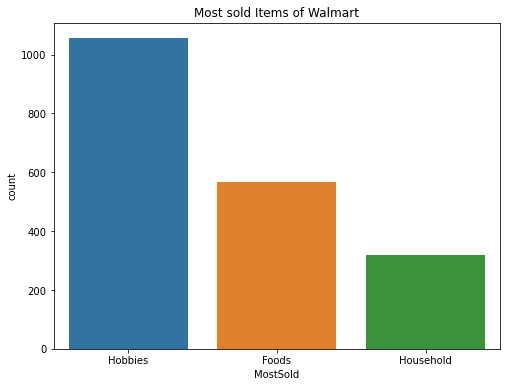

In [26]:
import matplotlib.pyplot as pl
pl.figure(figsize=(8,6))
sns.countplot(walmart_df['MostSold'])
pl.title('Most sold Items of Walmart')
pl.show()

In [27]:
temp_=walmart_df['MostSold'].value_counts().reset_index().rename(columns={'index':'Item','MostSold':'Counts'})
temp_

,Item,Counts
0,Hobbies,1056
1,Foods,567
2,Household,318


In [28]:
fig=go.Figure(go.Bar(
x=temp_['Item'],
    y=temp_['Counts'],
    text=temp_['Counts'],
    textposition='outside',
    marker=dict(color=['peru','lightsteelblue','gainsboro'])
))
fig.show()

In [29]:
walmart_sample=walmart_df.groupby('MostSold').apply(lambda x: x.sample(10)).reset_index(drop=True)
walmart_sample.head()

,Hobbies,Household,Foods,Total,MostSold
0,404.104478,464.324285,573.607491,1442.036254,Foods
1,484.514925,349.557204,509.339705,1343.411834,Foods
2,490.671642,543.811650,724.321846,1758.805137,Foods
3,626.119403,664.410685,674.944493,1965.474580,Foods
4,455.223881,383.900929,470.291534,1309.416343,Foods


In [38]:
fig=px.scatter_ternary(walmart_df,
                      a='Hobbies',b='Household',c='Foods',
                      color='MostSold',
                      size='Total',
                      size_max=15,
                      color_discrete_map={'Hobbies':'blue',
                                         'Household':'green',
                                          'Foods':'red'
                                         }
                      )


fig.show()

In [51]:
us_score=list(world[world['country']=='USA'][['year','score']].groupby(['year']).sum()['score'])
uk_score=list(world[world['country']=='United Kingdom'][['year','score']].groupby(['year']).sum()['score'])

year_score=list(world['year'].unique())




In [56]:
fig=go.Figure()

fig.add_trace(go.Scatter(x=year_score,
                        y=us_score,name='USA'))
fig.add_trace(go.Scatter(x=year_score,
                        y=uk_score,name='UK'))

fig.update_layout(title='Total Score of US and US Uniersities')
fig.show()

In [69]:
names=shoot['race'].unique()
names=[x for x in names if str(x)!='nan']
shoot['date']=pd.to_datetime(shoot['date'])
shoot['year']=shoot['date'].dt.year

all_race_shoot=[]

for i in names:
    all_race_shoot.append(list(shoot[shoot['race']==i]['year'].value_counts().reset_index()['year']))

    
    
all_race_shoot=np.array(all_race_shoot)

all_race_shoot

array([[ 20,  19,  16,  15,  14,  10],
       [498, 470, 461, 456, 404, 298],
       [180, 172, 165, 163, 160,  99],
       [258, 250, 234, 229, 224, 146],
       [ 14,  11,   9,   6,   4,   3],
       [ 22,  16,  15,  13,   9,   5]])

In [89]:
fig=go.Figure(data=[go.Candlestick(x=bajaj['Date'],
                    open=bajaj['Open'],
                    high=bajaj['High'],
                    low=bajaj['Low'],
                    close=bajaj['Close']
                                  )])
a
fig.show()

In [92]:
fig=go.Figure(data=[go.Candlestick(x=ic['Date'],
                    open=ic['Open'],
                    high=ic['High'],
                    low=ic['Low'],
                    close=ic['Close']
                                  )])

fig.show()

In [95]:
bajaj[['High','Low','Close','Open']].head()

,High,Low,Close,Open
0,619.00,501.0,509.10,600.00
1,610.95,491.1,554.65,505.00
2,665.60,564.0,640.95,564.00
3,703.00,608.0,632.40,656.65
4,668.00,588.3,644.00,642.40


In [111]:
fig=go.Figure(data=go.Candlestick(
x=bajaj['Date'],
    open=bajaj['Open'],
    close=bajaj['Close'],
    low=bajaj['Low'],
    high=bajaj['High']
))

fig.update_layout(title='Candlestick Series of Bajaj Finsv Stock data',
                 xaxis_rangeslider_visible=True,
                shapes=[dict(x0='2015-01-09',
                            x1='2015-01-09',
                            y0=0,
                            y1=1,
                            xref='x',
                            yref='paper',
                            line_width=2)],
                  
                  annotations=[dict(x='2015-01-09',y=0.05,
                                   xref='x',
                                   yref='paper',
                                   showarrow=False,
                                   xanchor='left',
                                   text='Booming period of Bajaj Begins')]
                  
                 )



fig.show()